# Denoising Diffusion Probabilistic Model


Adapted from [this Keras tutorial](https://keras.io/examples/generative/ddpm/) by [A_K_Nain](https://twitter.com/A_K_Nain) (2022).  This notebook implements the [Denoising Diffusion Probabilistic Models](https://arxiv.org/abs/2006.11239) paper (DDPMs for short). It was the first paper demonstrating the use of diffusion models for generating high-quality images.

## Introduction



<!-- ![diffusion process gif](images/diffusion/diffused-cat.gif) -->

<img src="https://raw.githubusercontent.com/jchwenger/AI/main/lectures/09.more/images/diffusion/diffused-cat.gif">



Generative modeling experienced tremendous growth in the last five years. Models like VAEs, GANs, and flow-based models proved to be a great success in generating high-quality content, especially images. Diffusion models are a new type of generative model that has proven to be better than previous approaches.

Diffusion models are inspired by non-equilibrium thermodynamics, and they learn to generate by denoising. Learning by denoising consists of two processes, each of which is a **Markov Chain** (where each step is only dependent on the previous step). These are:

1. The **forward process**: in the forward process, we slowly add random noise to the data in a series of time steps `(t1, t2, ..., tn )`. Samples at the current time step are drawn from a Gaussian distribution where the mean of the distribution is conditioned on the sample at the previous time step, and the variance of the distribution follows a fixed schedule. At the end of the forward process, the samples end up with a pure noise distribution.

2. The **reverse process**: During the reverse process, we try to undo the added noise at every time step. We start with the pure noise distribution (the last step of the forward process) and try to denoise the samples in the backward direction `(tn, tn-1, ..., t1)`.


<!-- ![diffusion process, figure 2](images/diffusion/ddpm.diffusion-figure-2.png) -->

<img src="https://raw.githubusercontent.com/jchwenger/AI/main/lectures/09.more/images/diffusion/ddpm.diffusion-figure-2.png">

Source: [Ho et al, "Denoising Diffusion Probabilistic Models"](https://arxiv.org/abs/2006.11239)

- $q$ is the distribution going from $x_0$ to $x_T$, the **forward** process (adding noise, or noising). This is _known_ and computable _in closed form_: we don't need to _learn_ it, we can just compute it.
- $p_{\theta}$, on the other hand, goes from $x_T$ to $x_0$, and is the **reverse** process (removing noise, or denoising). This is _learnt_ by our model (note the $\theta$, our parameters). The bigger the steps (removing more noise in one go), the harder it is.

In its original formulation, each of the intermediate steps is conceived as a *latent variable* of the same dimensionality as the input. As if this was a very, very deep stack of **autoencoders** (each $q$ at each step is an **encoder**, each $p_{\theta}$ is a **decoder**, with the main feature that we don't need to learn $q$, the transitions are computable in closed form)!

Because of this multi-step process, the first versions of diffusion models have been much **slower** at generating images than GANs. A lot of research has been dedicated to accelerating this. One of the first example has been to abandon the Markov property (so 'skip' steps to make 'larger jumps' in the denoising process): an example of that is the Denoising Diffusion Implicit Model, or DDIM, you can find an example of it [here](https://keras.io/examples/generative/ddim/)).

## Setup

In [1]:
import math
import tqdm
import pathlib

import numpy as np
import matplotlib.pyplot as plt

# Requires TensorFlow >=2.11 for the GroupNormalization layer.
import tensorflow as tf
import tensorflow_datasets as tfds

## Hyperparameters

In [2]:
batch_size = 64
num_epochs = 800  # This takes ~1h on an A100
total_timesteps = 1000
norm_groups = 8  # Number of groups used in GroupNormalization layer
learning_rate = 2e-4

img_size = 64
img_channels = 3
clip_min = -1.0
clip_max = 1.0

first_conv_channels = 64
channel_multiplier = [1, 2, 4, 8]
widths = [first_conv_channels * mult for mult in channel_multiplier]
has_attention = [False, False, True, True]
num_res_blocks = 2  # Number of residual blocks

dataset_name = "oxford_flowers102"
splits = ["train"]

## Dataset & Augmentation



We use the [Oxford Flowers 102](https://www.tensorflow.org/datasets/catalog/oxford_flowers102)
dataset for generating images of flowers. In terms of preprocessing, we use center
cropping for resizing the images to the desired image size, and we rescale the pixel
values in the range `[-1.0, 1.0]`. This is in line with the range of the pixel values that
was applied by the authors of the [DDPMs paper](https://arxiv.org/abs/2006.11239). For
augmenting training data, we randomly flip the images left/right.

In [3]:
# Load the dataset
(ds,) = tfds.load(dataset_name, split=splits, with_info=False, shuffle_files=True)


def augment(img):
    """Flips an image left/right randomly."""
    return tf.image.random_flip_left_right(img)


def resize_and_rescale(img, size):
    """Resize the image to the desired size first and then
    rescale the pixel values in the range [-1.0, 1.0].

    Args:
        img: Image tensor
        size: Desired image size for resizing
    Returns:
        Resized and rescaled image tensor
    """

    height = tf.shape(img)[0]
    width = tf.shape(img)[1]
    crop_size = tf.minimum(height, width)

    img = tf.image.crop_to_bounding_box(
        img,
        (height - crop_size) // 2, # top left corner (x & y) (to center,
        (width - crop_size) // 2,  # get half of the remainder, i.e. 'margins')
        crop_size,                 # width
        crop_size,                 # height
    )

    # Resize
    img = tf.cast(img, dtype=tf.float32)
    img = tf.image.resize(img, size=size, antialias=True)

    # Rescale the pixel values
    img = img / 127.5 - 1.0
    img = tf.clip_by_value(img, clip_min, clip_max)
    return img


def train_preprocessing(x):
    img = x["image"]
    img = resize_and_rescale(img, size=(img_size, img_size))
    img = augment(img)
    return img


train_ds = (
    ds.map(train_preprocessing, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(batch_size, drop_remainder=True)
    .shuffle(batch_size * 2)
    .prefetch(tf.data.AUTOTUNE)
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/1020 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.UV98C0_2.1.1/oxford_flowers102-train.tfrecord…

Generating test examples...:   0%|          | 0/6149 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.UV98C0_2.1.1/oxford_flowers102-test.tfrecord*…

Generating validation examples...:   0%|          | 0/1020 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.UV98C0_2.1.1/oxford_flowers102-validation.tfr…

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.


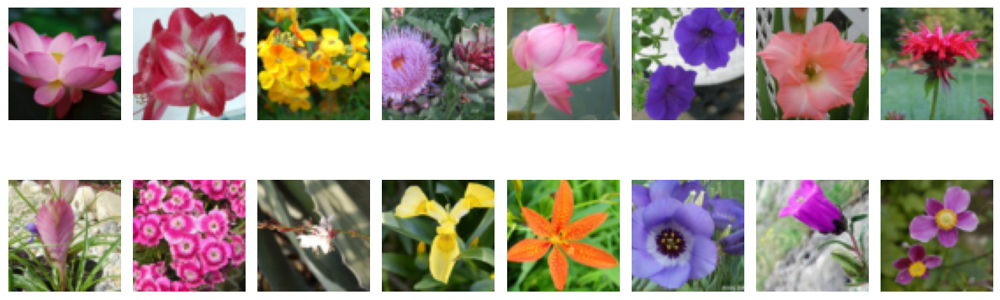

In [4]:
def plot_images(images, num_rows=2, num_cols=8, figsize=(12, 5)):

    assert len(images) <= num_rows * num_cols, f"Too many images ({len(images)}) for {num_rows} rows x {num_cols} cols ({num_rows * num_cols} slots): please increase either the rows or the columns!"

    # from [-1,1] to [0,255]
    images = tf.clip_by_value(images * 127.5 + 127.5, 0.0, 255.0).numpy().astype(np.uint8)

    _, ax = plt.subplots(num_rows, num_cols, figsize=figsize)
    # turn off all axes no matter how many images we have
    [a.axis("off") for row in ax for a in row]
    # display images
    for i, image in enumerate(images):
        if num_rows == 1: # if only one row
            ax[i].imshow(image)
        else:
            ax[i // num_cols, i % num_cols].imshow(image)

    plt.tight_layout()
    plt.show()

for batch in train_ds.take(1):
    plot_images(batch[:16])

## Gaussian diffusion utility ☠️ 
 

We define the forward process and the reverse process as a separate class, for convenience, and sometimes in various implementations have functions instead. Most of the code in this utility has been borrowed from the original implementation with some modifications: the main changes from the original tutorial was to merge various functions into one.

This is where things get hairy, sorry if that isn't made clearer!

### Noise schedule


We have $\beta_t$ as small numbers (a linear range), and:
- $\alpha_t = 1 - \beta_t$
- $\bar{\alpha_t} = \prod_{s=1}^t \alpha_s {\small \text{ (cumulative product)} } $

Note that throughout the process, training and sampling, it is possible to compute the variance in closed form, so that our model **will only learn to predict the means of our noise values**.

### Training

The workflow is the following:

- We sample a **mini-batch of images**, represented below as $x_0$.
- We **uniformly sample a mini-batch of timesteps** (our model will train to make _one denoising step_, from $t$ to $t-1$, but at any point between $0$ and $T$, and training on random steps of the chain).
- We sample some **Gaussian noise**, called $\epsilon$.
- We construct a **noised version of the image**, with the appropriate scaling (that's the advantage of this formulation: we can compute, in closed form, the appropriate amount of noise for any timestep $t$ directly from $x\_0$) and pass it through our $\epsilon_{\theta}$ is our **model** (predicting noise, hence the same name):

  $$x' = \underbrace{ \color{blue}{\sqrt{\bar{\alpha}_t}} \color{black}{\cdot x_0} }_{\small \text{ orig image, scaled } } + \underbrace{ \color{red}{\sqrt{1 - \bar{\alpha}_t}} \color{black}{\cdot \epsilon} }_{\small \text{ add noise, scaled} } $$

  Note that our model takes a **timestep** as argument as well, to allow it to learn to take that information into account:

  $$\epsilon_{\theta}(x', t)$$

- We take the **mean squared error** between the noise we sampled and the noise the model predicted:

  $$|| \epsilon - \epsilon_{\theta}(x', t)||^2$$

  How close are our predicted noisy pixels from the ones we can artificially compute for any time step? Then we use gradient descent to update our model parameters.

$$
\begin{array}{l}
\hline
\textbf{Algorithm 1} \quad \text{Training} \\
\hline
\text{1:} \ \textbf{repeat} \\
\text{2:} \ \ \ \mathbf{x}_0 \sim q(\mathbf{x}_0) \\
\text{3:} \ \ \ t \sim \text{Uniform}(\{1, \ldots, T\})\\
\text{4:} \ \ \ \boldsymbol{\epsilon} \sim \mathcal{N}(0, \mathbf{I}) \\
\text{5:} \ \ \ \text{Take gradient descent step on}\\
\quad \ \ \ \nabla_{\theta} \left\| \boldsymbol{\epsilon} - \overbrace{  \boldsymbol{\epsilon}_{\theta} \left( \underbrace{ \sqrt{\bar{\alpha}_t} \mathbf{x}_0 + \sqrt{1 - \bar{\alpha}_t} \boldsymbol{\epsilon} }_{ x_t } , t \right) }^{ \substack{ \text{given } x_t, t \text{ yield} \\ \text{Gaussian noise} } }  \right\|^2\\
\text{6:} \ \textbf{until} \text{ converged} \\
\hline
\end{array}
$$

Source (slightly edited): [Ho et al, "Denoising Diffusion Probabilistic Models"](https://arxiv.org/abs/2006.11239)

### Sampling

In order to create images, the workflow is as follows:

- We sample some **Gaussian noise (a fully noisy image, same shape**), that's $x_T$ ($T$ means the end of the forward/noising process).
- Then, for as many timesteps as we defined in our training phase:
  - We **predict the noise** in the current image using our model, also using the timestep:
$$\epsilon' = \epsilon_{\theta}(x_t,t)$$
  - We **remove the noise from the noisy image** $x_t$, after having appropriately scaled the noise:
$$x' = x_t - \text{scale} \cdot \epsilon' $$

    Note that in the algorithm below, the equation can be rewritten to be a **mixture of the noisy image at the previous time step, and the predicted noise, appropriately scaled**:
$$
\begin{aligned}
x_t - \color{red}{ \frac{1 - \alpha_t}{ \sqrt{1 - \bar{\alpha}_t} } } \color{black}{ \epsilon_{\theta}(x_t, t) } & = \\
\\
\underbrace{ x_t }_{\small \text{noisy image} } - \underbrace{ \color{red}{\text{coeff}_{noise}} \color{black}{\cdot \epsilon_{\theta}(x_t, t)} }_{ \small \text{remove scaled predicted noise} } & = x'
\end{aligned}
$$

 -  Finally, we **re-add some noise in the process, also scaled appropriately** (the $\sigma_t$, that depends on the timestep, that whole term is zero at the last timestep, when we reach the fully denoised image):

$$x_{t-1} = \underbrace{ \color{blue}{\frac{1}{\sqrt{\alpha_t}} } \color{black}{\cdot x'}  }_{ \small \text{scaled denoised image: } \mu } + \underbrace{ \color{green}{\sigma_t} \color{black}{\cdot z}  }_{\small \text{re-add scaled noise: } \sigma } $$

Note that this has the same form as the sampling used in the VAE (the reparametrisation trick): we are in effect sampling from a Gaussian distribution! Also, this last procedure (reinjecting noise just as we are denoising) injects stochasticity in the process, and is known under the name of **Langevin dynamics**.

$$
\begin{array}{l}
\hline
\textbf{Algorithm 2} \quad \text{Sampling} \\
 \sigma_t = \sqrt{ \beta_t }  \text{ or }  \sqrt{ \frac{ 1 - \bar{ \alpha }_{ t-1 }  }{ 1 - \bar{ \alpha }_t } \beta_t }  \ \star\\
\hline
\text{1:} \ \mathbf{x}_T \sim \mathcal{N}(0, \mathbf{I}) \\
\text{2:} \ \textbf{for } t = T, \ldots, 1 \textbf{ do} \\
\text{3:} \quad \mathbf{z} \sim \mathcal{N}(0, \mathbf{I}) \\
\text{4:} \quad \mathbf{x}_{t-1} = \frac{1}{ \underbrace{ \sqrt{ 1 - \beta_t } }_{ \sqrt{ \alpha_t } } } \left( \mathbf{x}_t - \underbrace{ \frac{ \overbrace{ \beta_t }^{ 1 - \alpha_t } }{ \sqrt{ 1 - \bar{ \alpha}_t } } \, \boldsymbol{\epsilon}_{ \theta} (\mathbf{x}_t, t) }_{ \approx \text{ noise to remove} } \right) + \sigma_t \mathbf{z} \tiny \leftarrow \text{reinject noise (Langevin dynamics)} \\
\text{5:} \ \textbf{end for} \\
\text{6:} \ \textbf{return } \mathbf{x}_0 \\
\hline
\star\ \text{Experimentally, similar results. (First optimal for } x_0 \sim \mathcal{N}(0, \mathbf{I} \text{), second } x_0 \\
\text{deterministically set to one point.)}
\end{array}
$$

Source (slightly modified): [Ho et al, "Denoising Diffusion Probabilistic Models"](https://arxiv.org/abs/2006.11239)

#### Note: Not quite exactly that!

Unfortunately, a close examination of the Gaussian sampler will reveal that the equations above are _not quite_ what you find in the code. Instead, and I believe this is done to stabilise training (reduce the variance of our estimater), what is done is to:

- Use $x_t$ (our noisy sample) and the predicted noise to reconstruct $x_0$.
- Mix that reconstructed $x_0$ with $x_t$ using the appropriate scaling.
- Reinject some noise (sampling with reparametrisation/Langevin dynamics).

A good clarification of the calculations behind all the scaling factors is still to be done!

#### Note: link to SDEs/ODEs

Because of the noise reinjection, the whole process of denoising can be viewed as being governed by a stochastic differential equation (SDE) (the DDIM paper, and other later additions to the literature, show that it's possible to achieve comparable results without the stochasticity, so only with an ordinary differential equation (ODE)). If the whole process can be viewed under this light, it is possible to use the whole machinery of known SDE/ODE solvers ([Euler-Moriyama](https://en.wikipedia.org/wiki/Euler%E2%80%93Maruyama_method), [Heun](https://en.wikipedia.org/wiki/Heun%27s_method), etc.), which you find in the current jungle of [schedulers](https://huggingface.co/docs/diffusers/main/en/api/schedulers/overview).

Here is what this process looks like for SDEs (you can see that going from one end of the process to another changes the nature of the distribution: from two modes to a Gaussian, or the reverse):


Forward/Noising:

<!-- ![SDE forward/noising](images/diffusion/song.perturb_vp.gif) -->

<img src="https://raw.githubusercontent.com/jchwenger/AI/main/lectures/09.more/images/diffusion/song.perturb_vp.gif">


Reverse/Denoising:

<!-- ![SDE reverse/denoising](images/diffusion/song.denoise_vp.gif) -->

<img src="https://raw.githubusercontent.com/jchwenger/AI/main/lectures/09.more/images/diffusion/song.denoise_vp.gif">

Source: [Song, "Generative Modeling by Estimating Gradients of the Data Distribution"](https://yang-song.net/blog/2021/score/)




### The Gaussian Diffusion class

In [5]:
class GaussianDiffusion:
    """Gaussian diffusion utility.

    Note:
        q refers to the forward process (noising, fixed)
        p refers to the reversed process (denoising, learnt)
        In the docstrings, B: batch_size, W: width, H: height, C: channels

    Args:
        beta_start: Start value of the scheduled variance
        beta_end: End value of the scheduled variance
        timesteps: Number of time steps in the forward process
    """

    def __init__(
        self,
        beta_start=1e-4,
        beta_end=0.02,
        timesteps=1000,
        clip_min=-1.0,
        clip_max=1.0,
    ):

        self.beta_start = beta_start
        self.beta_end = beta_end
        self.timesteps = timesteps
        self.clip_min = clip_min
        self.clip_max = clip_max

        self.num_timesteps = int(timesteps)

        # ----------------------------------------------------------------------
        # PRECOMPUTED VALUES (at all time steps)
        # for diffusion q(x_t | x_{t-1}) and others

        def tf_const(x):
            return tf.constant(x, dtype=tf.float32)

        # Linear variance schedule (float64 for better precision)
        self.betas = betas = np.linspace(beta_start, beta_end, timesteps, dtype=np.float64)
        self.betas = tf_const(betas)

        alphas = 1.0 - betas

        # alphas_bar_t
        alphas_cumprod = np.cumprod(alphas, axis=0)
        self.alphas_cumprod = tf_const(alphas_cumprod)

        # alphas_bar_t-1
        alphas_cumprod_prev = np.append(1.0, alphas_cumprod[:-1])
        self.alphas_cumprod_prev = tf_const(alphas_cumprod_prev)

        # sqrt(alphas_bar) | used in `q_sample`
        self.sqrt_alphas_cumprod = tf_const(np.sqrt(alphas_cumprod))

        # sqrt(1 - alphas bar) | used in `q_sample`
        self.sqrt_one_minus_alphas_cumprod = tf_const(np.sqrt(1.0 - alphas_cumprod))

        # sqrt(1/alphas_bar) | used in `p_sample`
        self.sqrt_recip_alphas_cumprod = tf_const(np.sqrt(1.0 / alphas_cumprod))

        # sqrt(1/alphas_bar - 1) | `used in p_sample`
        self.sqrt_recipm1_alphas_cumprod = tf_const(np.sqrt(1.0 / alphas_cumprod - 1))

        # ----------------------------------------------------------------------
        # VARIANCE (fixed / available in closed form!)

        #  2 eq. (7) | betas_tilde_t (= sigma**2) | calculations for posterior q(x_{t-1} | x_t, x_0)
        posterior_variance = (betas * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod))
        self.posterior_variance = tf_const(posterior_variance)

        # Log calculation clipped because the posterior variance is 0 at the
        # beginning of the diffusion chain | used in `p_sample`
        self.posterior_log_variance_clipped = tf_const(np.log(np.maximum(posterior_variance, 1e-20)))

        # ----------------------------------------------------------------------
        # MEAN (learnt, coefficient only) | both used in `p_sample`

        # 2 eq. (7) | coef1 * x_0 | sqrt(alphas_bar_t-1) * betas / (1 - alphas_bar))
        self.posterior_mean_coef1 = tf_const(np.sqrt(alphas_cumprod_prev) * betas / (1.0 - alphas_cumprod))

        # 2 eq. (7) | coef2 * x_t | sqrt(alphas) * (1 - alphas_bar_t-1) / (1 - alphas_bar)
        self.posterior_mean_coef2 = tf_const(np.sqrt(alphas) * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod))

    # --------------------------------------------------------------------------
    # UTIL: extract precomputed values at various timesteps

    def _extract(self, a, t, x_shape, verbose=False):
        """
        Extract some coefficients at specified timesteps, then reshape to
        (B, 1, 1, 1) (data: (B, W, H, C)) for broadcasting.

        Args:
            a (T,): Tensor to extract from
            t (B,): Timestep for which the coefficients are to be extracted
            x_shape (B, W, H, C): Shape of the current batched samples

        Returns:
            out, (B, 1, 1, 1): Extracted tensor
        """
        batch_size = x_shape[0]
        out = tf.gather(a, t)
        if verbose: print(f"out shape: {out.shape=}")
        return tf.reshape(out, [batch_size, 1, 1, 1])

    # --------------------------------------------------------------------------
    # TRAINING: generate noisy samples

    def q_sample(self, x_0, t, noise):
        """
        Diffuse the data | 3.2 Algorithm 1:
            sqrt(alphas_bar) * x_0 + sqrt(1 - alphas_bar) * noise

        Args:
            x_0 (B, W, H, C): Initial batch of samples (before the 1st diffusion step)
            t (B): Current timestep
            noise (B, W, H, C): Gaussian noise to be added at the current timestep

        Returns:
            (B, W, H, C): Diffused samples at timestep `t`

        Note:
            Used by `DiffusionModel` in `train_step`, step 4
        """
        x_0_shape = tf.shape(x_0)
        # coef1: sqrt(alphas_bar), coef2: sqrt(1 - alphas_bar)
        coef1 = self._extract(self.sqrt_alphas_cumprod, t, tf.shape(x_0))
        coef2 = self._extract(self.sqrt_one_minus_alphas_cumprod, t, x_0_shape)
        # mix x_0 with gaussian noise
        return coef1 * x_0 + coef2 * noise

    # --------------------------------------------------------------------------
    # SAMPLING: use noisy samples (x_t) to predict the noise and remove it

    def p_sample(self, pred_noise, x_t, t, clip_denoised=True):

        x_t_shape = tf.shape(x_t)

        # 1. `p_mean_variance`: reconstruct x_0 from noisy sample and noise prediction
        #    3.2 Algorithm 2 | Compute the mean of the reconstructed (denoised) sample:
        #    [coef1: sqrt(1/alphas_bar_t)] * x_t - [coef2: sqrt(1/alphas_bar - 1)] * pred_noise

        coef1 = self._extract(self.sqrt_recip_alphas_cumprod, t, x_t_shape)
        coef2 = self._extract(self.sqrt_recipm1_alphas_cumprod, t, x_t_shape)
        x_0_reconstructed = coef1 * x_t - coef2 * pred_noise

        # 2. clip
        if clip_denoised:
            x_0_reconstructed = tf.clip_by_value(x_0_reconstructed, self.clip_min, self.clip_max)

        # 3. `q_posterior`
        #     2 eq. (7) | Compute the mean and variance of the diffusion posterior: q(x_{t-1} | x_t, x_0)
        #     coef1 (* x_0) | sqrt(alphas_bar_t-1) * betas / (1 - alphas_bar))
        #     coef2 (* x_t) | sqrt(alphas) * (1 - alphas_bar_t-1) / (1 - alphas_bar)

        coef1 = self._extract(self.posterior_mean_coef1, t, x_t_shape)
        coef2 = self._extract(self.posterior_mean_coef2, t, x_t_shape)
        # compute mean: mu_tilde_t(x_t, x_0)
        model_mean = coef1 * x_0_reconstructed + coef2 * x_t

        # extract precomputed variance (our sigma, for sigma z):
        # beta_tilde_t = betas * (1 - alphas_bar_t-1) / (1 - alphas_bar)
        model_log_variance = self._extract(self.posterior_log_variance_clipped, t, x_t_shape)

        # reinject some noise (Langevin dynamics)
        noise = tf.random.normal(shape=x_t.shape, dtype=x_t.dtype)

        # no noise when t == 0
        # (if t == 0, the mask is zero, removing tf.exp... * noise below)
        nonzero_mask = tf.reshape(
            1 - tf.cast(tf.equal(t, 0), tf.float32), [tf.shape(x_t)[0], 1, 1, 1]
        )

        # mu + mask * sqrt(var) (= sigma) * noise
        return model_mean + nonzero_mask * tf.exp(0.5 * model_log_variance) * noise

### Studying the Gaussian Sampler

In [6]:
gfd = GaussianDiffusion(timesteps=total_timesteps)
print(f"{gfd.timesteps} timesteps")
print(f"Betas ranging from:           {gfd.beta_start}            to {gfd.beta_end}")
print(f"Alphas bar t ranging from     {gfd.alphas_cumprod[0].numpy():.15f} to {gfd.alphas_cumprod[-1].numpy():.15f}")
print(f"Alphas bar t - 1 ranging from {gfd.alphas_cumprod_prev[0].numpy():.15f} to {gfd.alphas_cumprod_prev[-1].numpy():.15f}")

1000 timesteps
Betas ranging from:           0.0001            to 0.02
Alphas bar t ranging from     0.999899983406067 to 0.000040358296246
Alphas bar t - 1 ranging from 1.000000000000000 to 0.000041181934648


#### Plotting $\beta_t$, $\alpha$ and $\bar{\alpha}_t$

The $\beta_t$ are a series of small values linearly increasing from `1e-4` to `0.02`.

The $\alpha_t = 1 - \beta_t$ decrease linearly, mirroring the process.

The $\bar{\alpha}_t = \prod_{s=1}^t \alpha_s $, are  cumulative products of the $\alpha$ up to timestep $t$.

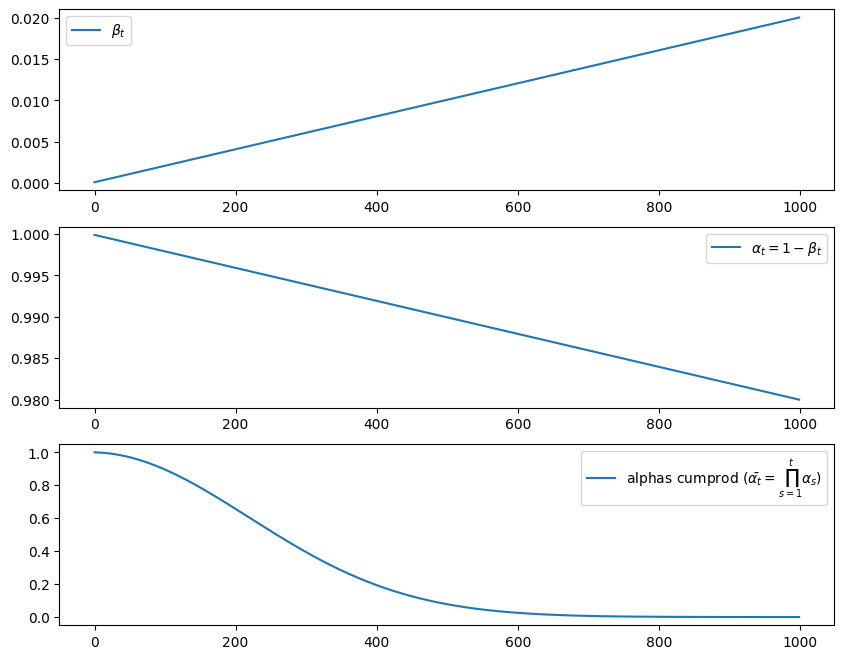

In [7]:
_, ax = plt.subplots(3, 1, figsize=(10,8))

ax[0].plot(range(gfd.timesteps), gfd.betas, label="$\\beta_t$")
ax[0].legend()
ax[1].plot(range(gfd.timesteps), 1 - gfd.betas, label="$\\alpha_t = 1 - \\beta_t$")
ax[1].legend()
ax[2].plot(range(gfd.timesteps), gfd.alphas_cumprod, label="alphas cumprod ($\\bar{\\alpha_t} =  \\prod_{s=1}^t \\alpha_s $)")
ax[2].legend()

plt.show()

#### The Nonzero mask

The nonzero mask will be zero when `t` is zero, one otherwise. During computation, multiplying the noise tensor (our standard deviation, or $\sqrt{\sigma^2}$) by it will simply turn the noise to zero for timestep zero.

In [8]:
for batch in train_ds.take(1):

    # work on a tiny batch
    n = 3
    b = batch[:n]

    # fake timesteps (not randomly sampled), to guarantee
    # we have at least one zero
    t = tf.range(n)

    nonzero_mask = tf.reshape(
        1 - tf.cast(tf.equal(t, 0), tf.float32), [n, 1, 1, 1]
    )

    print(f"batch shape:         {b.shape}")
    print()
    print(f"t, shape:            {t.shape}")
    print(t)
    print()
    print(f"nonzero mask, shape: {nonzero_mask.shape}")
    print("the nonzero mask is one for t > 0, zero otherwise:")
    print()
    print(nonzero_mask)

batch shape:         (3, 64, 64, 3)

t, shape:            (3,)
tf.Tensor([0 1 2], shape=(3,), dtype=int32)

nonzero mask, shape: (3, 1, 1, 1)
the nonzero mask is one for t > 0, zero otherwise:

tf.Tensor(
[[[[0.]]]


 [[[1.]]]


 [[[1.]]]], shape=(3, 1, 1, 1), dtype=float32)


## Network architecture



The **U-Net**, originally developed for semantic segmentation, is an architecture that is widely used for implementing diffusion models but with some slight modifications:

1. The network accepts two inputs: Image and time step
2. Self-attention between the convolution blocks once we reach a specific resolution (16x16 in the paper)
3. Use of Group Normalization

Note the use of the `swish` activation function throughout the network, as well as the variance scaling kernel initializer, as in the original paper.

The original tutorial has `groups=8` for the `GroupNormalization` layer, which seemingly produces better results on the flower dataset compared to the default value of `groups=32`. Dropout is optional and should be used where chances of overfitting is high. In the paper, the authors used dropout only when training on CIFAR10.

<!-- ![u-net](images/diffusion/u-net.jpeg) -->

<img style="height: 400px;"   src="https://raw.githubusercontent.com/jchwenger/AI/main/lectures/09.more/images/diffusion/u-net.jpeg">

Source: [U-Net: Convolutional Networks for Biomedical Image Segmentation](https://arxiv.org/abs/1505.04597)

### Initializer

This is an advanced trick to make sure the initial random weights have good values for the stability of the training processs.

In [9]:
# Kernel initializer to use
def kernel_init(scale):
    scale = max(scale, 1e-10)
    return tf.keras.initializers.VarianceScaling(
        scale, mode="fan_avg", distribution="uniform"
    )

### Time Embedding

This is in fact the sinusoidal embedding scheme (that was replaced by learnt embeddings in e.g. GPT-2), see [here](https://nlp.seas.harvard.edu/annotated-transformer/#positional-encoding) for a short explanation.

In [10]:
class TimeEmbedding(tf.keras.layers.Layer):
    """
    A Layer creating Time Embedding tensors.

    Attributes:
        dim: the dimension of (output) embedding space (D)
    """
    def __init__(self, dim, **kwargs):
        super().__init__(**kwargs)
        self.dim = dim
        self.half_dim = dim // 2
        self.emb = math.log(10000) / (self.half_dim - 1)
        self.emb = tf.exp(tf.range(self.half_dim, dtype=tf.float32) * -self.emb)

    def call(self, inputs):
        """
        Args:
            inputs: a tensor, e.g. of time steps, shape: (T,)

        Returns:
            emb: a tensor of embedding, shape: (T, D) # D: embedding dim
        """
        inputs = tf.cast(inputs, dtype=tf.float32)
        emb = inputs[:, None] * self.emb[None, :]
        emb = tf.concat([tf.sin(emb), tf.cos(emb)], axis=-1)
        return emb

#### Testing the `TimeEmbedding` layer

In [11]:
# random timesteps
t = tf.range(100, dtype=tf.int64)
print(f"max timestep: {total_timesteps}, batch size: {batch_size}")
print()
print(f"timesteps tensor, shape: {t.shape}")
print(t)
print()

temb = TimeEmbedding(dim=first_conv_channels * 4)(t)

print(f"embedding dim: {first_conv_channels * 4}")
print()
print(f"time embeddings tensor, shape: {temb.shape}")
print(temb)

max timestep: 1000, batch size: 64

timesteps tensor, shape: (100,)
tf.Tensor(
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98 99], shape=(100,), dtype=int64)

embedding dim: 256

time embeddings tensor, shape: (100, 256)
tf.Tensor(
[[ 0.          0.          0.         ...  1.          1.
   1.        ]
 [ 0.841471    0.80164677  0.7610847  ...  1.          1.
   1.        ]
 [ 0.90929747  0.95844567  0.98735905 ...  1.          1.
   1.        ]
 ...
 [ 0.37960774  0.7782232   0.79535306 ...  0.9999371   0.99994564
   0.999953  ]
 [-0.57338184 -0.0382053   0.05458004 ...  0.9999358   0.9999445
   0.99995196]
 [-0.99920684 -0.82390124 -0.724546   ...  0.9999345   0.9999434
   0.999951  ]], shape=(100, 256), dtype=float32)


#### Visualisation 1

The concept behind time embedding is to find a mathematical representation of "position" that can be added to the representation of "meaning" (word embeddings):
- we want small enough numbers that they don't override the meaning representation entirely;
- we want close positions to be similar to each other;
- we want the models to be able to learn that representation (hence the idea of using a function to produce that in the first place, models are good at approximating functions);
- ideally we would like the model to be able to extrapolate to unknown positions.

Adapted from a visualisation idea found [here](https://nlp.seas.harvard.edu/annotated-transformer/#positional-encoding).

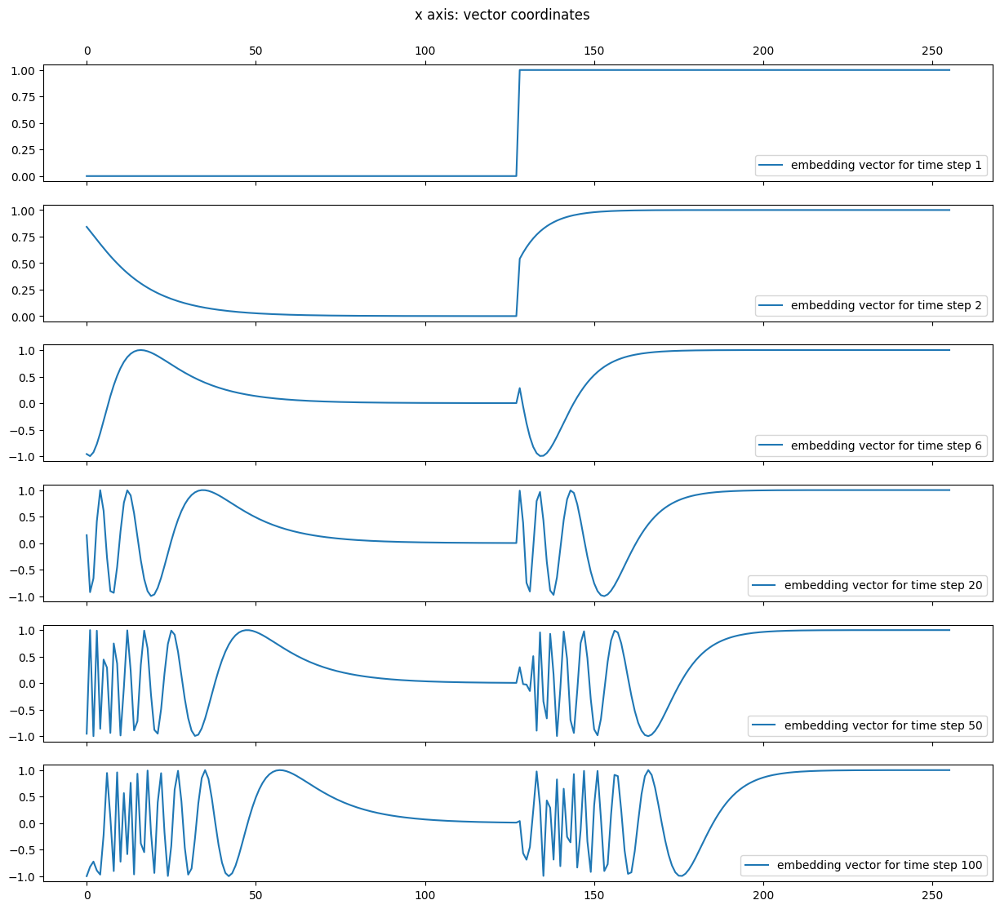

In [12]:
fig, axs = plt.subplots(6,1,figsize=(15,13), sharex=True)

r = tf.range(temb.shape[1])
# choosing arbitrarily a few time steps here ↓
for i, (ax, step) in enumerate(zip(axs, (0,1,5,19, 49, 99))):
    if i == 0: # additional ticks for the top subplot
        ax.tick_params(labelbottom=False, top=True, labeltop=True)
    ax.plot(r, temb[step], label=f"embedding vector for time step {step+1}")
    ax.legend(loc="lower right")
fig.supxlabel("x axis: vector coordinates", y=.92)
fig.show()

#### Visualisation 2

The same as above can be visualised for all time steps.

Read the following figure like so:
- **horizontally**, each row is _one embedding_: the top row is the vector representation for "position 0 in any sequence";
- instead of seeing the whole (beautiful) pattern emerging, imagine **extracting two rows and comparing them**: because of the variability of the various frequencies, no two rows are equal!

The colour coding shows the value of the coordinates, allowing us to see the variation.

Randomly started with code from [here](https://www.youtube.com/watch?v=8JVETFNWlBc), and adapted, with some questions to ChatGPT 4o.


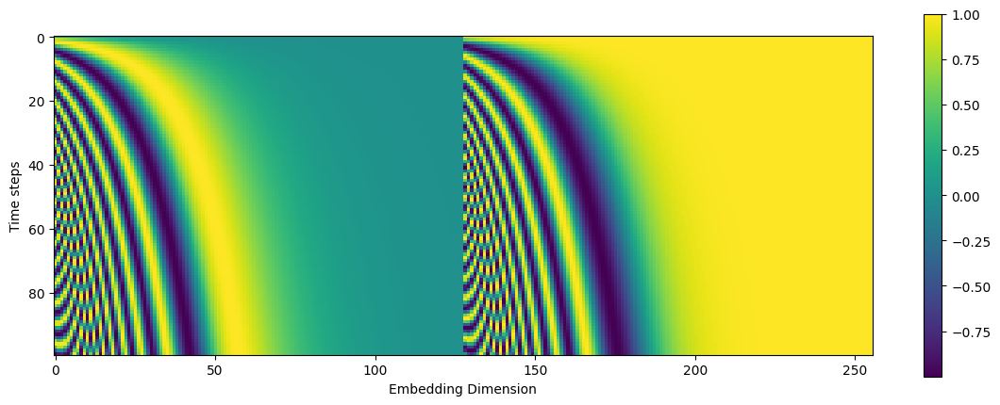

In [13]:
fig, ax = plt.subplots(figsize=(14, 5))
cax = ax.matshow(temb)
ax.set_xlabel("Embedding Dimension")
ax.xaxis.set_ticks_position("bottom")
ax.set_ylabel("Time steps")
plt.gcf().colorbar(cax)

### Time Multi Layer Perceptron (MLP)

In [14]:
def TimeMLP(units, activation_fn=tf.keras.activations.swish):
    """
    A Multilayer Perceptron (two layers).

    Args:
        units: integer, the hidden dimension of our two layers.

    Our input shape is (B,T) # batch size, timesteps
    Our output shape will be (B, units)
    """
    def apply(inputs):
        # print(inputs.shape)
        temb = tf.keras.layers.Dense(
            units, activation=activation_fn, kernel_initializer=kernel_init(1.0)
        )(inputs)
        # print(temb.shape)
        temb = tf.keras.layers.Dense(units, kernel_initializer=kernel_init(1.0))(temb)
        # print(temb.shape)
        return temb

    return apply

### Attention, Up-/Downsample Layers


In [15]:
class AttentionBlock(tf.keras.layers.Layer):
    """Applies self-attention.

    Args:
        units: Number of units in the dense layers
        groups: Number of groups to be used for GroupNormalization layer
    """

    def __init__(self, units, groups=8, **kwargs):
        self.units = units
        self.groups = groups
        super().__init__(**kwargs)

        self.norm = tf.keras.layers.GroupNormalization(groups=groups)
        self.query = tf.keras.layers.Dense(units, kernel_initializer=kernel_init(1.0))
        self.key = tf.keras.layers.Dense(units, kernel_initializer=kernel_init(1.0))
        self.value = tf.keras.layers.Dense(units, kernel_initializer=kernel_init(1.0))
        self.proj = tf.keras.layers.Dense(units, kernel_initializer=kernel_init(0.0))

    def call(self, inputs):
        batch_size = tf.shape(inputs)[0]
        height = tf.shape(inputs)[1]
        width = tf.shape(inputs)[2]

        inputs = self.norm(inputs)
        q = self.query(inputs)
        k = self.key(inputs)
        v = self.value(inputs)

        # 1 / sqrt(d_k) in Transformer paper [scale down the dot product to avoid vanishing gradients]
        scale = tf.cast(self.units, tf.float32) ** (-0.5)

        # X = Q*K^T/sqrt(d_k)
        attn_score = tf.einsum("bhwc, bHWc->bhwHW", q, k) * scale
        attn_score = tf.reshape(attn_score, [batch_size, height, width, height * width])

        # X = softmax(X)
        attn_score = tf.nn.softmax(attn_score, -1)
        attn_score = tf.reshape(attn_score, [batch_size, height, width, height, width])

        # X = X*V
        proj = tf.einsum("bhwHW,bHWc->bhwc", attn_score, v)

        # affine layer
        proj = self.proj(proj)
        return inputs + proj


# swish (or silu): swish(x) = x * sigmoid(x) | https://www.tensorflow.org/api_docs/python/tf/keras/activations/silu
def ResidualBlock(width, groups=8, activation_fn=tf.keras.activations.swish):
    def apply(inputs):
        x, t = inputs
        input_width = x.shape[3]

        if input_width == width:
            residual = x
        else:
            residual = tf.keras.layers.Conv2D(
                width, kernel_size=1, kernel_initializer=kernel_init(1.0)
            )(x)

        temb = activation_fn(t)
        temb = tf.keras.layers.Dense(
            width, kernel_initializer=kernel_init(1.0)
        )(temb)[:, None, None, :]

        x = tf.keras.layers.GroupNormalization(groups=groups)(x)
        x = activation_fn(x)
        x = tf.keras.layers.Conv2D(
            width, kernel_size=3, padding="same", kernel_initializer=kernel_init(1.0)
        )(x)

        x = tf.keras.layers.Add()([x, temb])
        x = tf.keras.layers.GroupNormalization(groups=groups)(x)
        x = activation_fn(x)

        x = tf.keras.layers.Conv2D(
            width, kernel_size=3, padding="same", kernel_initializer=kernel_init(0.0)
        )(x)
        x = tf.keras.layers.Add()([x, residual])
        return x

    return apply


def DownSample(width):
    def apply(x):
        return tf.keras.layers.Conv2D(
            width, kernel_size=3, strides=2, padding="same", kernel_initializer=kernel_init(1.0),
        )(x)
    return apply


def UpSample(width, interpolation="nearest"):
    def apply(x):
        x = tf.keras.layers.UpSampling2D(size=2, interpolation=interpolation)(x)
        x = tf.keras.layers.Conv2D(
            width, kernel_size=3, padding="same", kernel_initializer=kernel_init(1.0)
        )(x)
        return x
    return apply

### The U-Net

In [16]:
def build_model(
    img_size,      # note: works only for square images
    img_channels,
    widths,
    has_attention, # [False, False, True, True]
    num_res_blocks=2,
    norm_groups=8,
    interpolation="nearest",
    activation_fn=tf.keras.activations.swish,
):
    image_input = tf.keras.layers.Input(
        shape=(img_size, img_size, img_channels), name="image_input"
    )
    time_input = tf.keras.Input(shape=(), dtype=tf.int64, name="time_input")

    x = tf.keras.layers.Conv2D(
        first_conv_channels,
        kernel_size=(3, 3),
        padding="same",
        kernel_initializer=kernel_init(1.0),
    )(image_input)

    temb = TimeEmbedding(dim=first_conv_channels * 4)(time_input)
    temb = TimeMLP(units=first_conv_channels * 4, activation_fn=activation_fn)(temb)

    skips = [x]

    # DownBlock
    for i in range(len(widths)):
        for _ in range(num_res_blocks):
            x = ResidualBlock(
                widths[i], groups=norm_groups, activation_fn=activation_fn
            )([x, temb])
            if has_attention[i]:
                x = AttentionBlock(widths[i], groups=norm_groups)(x)
            skips.append(x)
        if widths[i] != widths[-1]:
            x = DownSample(widths[i])(x)
            skips.append(x)

    # MiddleBlock
    x = ResidualBlock(
        widths[-1], groups=norm_groups, activation_fn=activation_fn
    )([x, temb])
    x = AttentionBlock(widths[-1], groups=norm_groups)(x)
    x = ResidualBlock(
        widths[-1], groups=norm_groups, activation_fn=activation_fn
    )([x, temb])

    # UpBlock
    for i in reversed(range(len(widths))):
        for _ in range(num_res_blocks + 1):
            x = tf.keras.layers.Concatenate(axis=-1)([x, skips.pop()])
            x = ResidualBlock(
                widths[i], groups=norm_groups, activation_fn=activation_fn
            )([x, temb])
            if has_attention[i]:
                x = AttentionBlock(widths[i], groups=norm_groups)(x)
        if i != 0:
            x = UpSample(widths[i], interpolation=interpolation)(x)

    # End block
    x = tf.keras.layers.GroupNormalization(groups=norm_groups)(x)
    x = activation_fn(x)
    x = tf.keras.layers.Conv2D(3, (3, 3), padding="same", kernel_initializer=kernel_init(0.0))(x)
    return tf.keras.Model([image_input, time_input], x, name="unet")


## Training


### Optimizer, EMA Model

The training set-up is the same as in the paper.

The model is used as a **noise prediction network**, i.e. at every training step, we input a batch of images and corresponding time steps to our U-Net, and the network outputs the noise as predictions.


#### Optimizer



`Adam` optimizer with a learning rate of `2e-4`.


#### EMA model



It has been found that keeping a copy of model parameters, and updating it with the newest update but using an **Exponential Moving Average** logic (go back to [Andrew Ng's video](https://www.youtube.com/watch?v=lAq96T8FkTw) for a refresher if you need), with a $\beta$/decay factor of 0.999.



#### Loss & metrics


The loss function used is the **mean squared error** (the squared distance between our prediction for each – noise – pixel and the known, generated noise at each step). In practice, though, it is also common to use the [mean absolute error](https://www.tensorflow.org/api_docs/python/tf/keras/losses/MeanAbsoluteError) or the [Huber loss](https://www.tensorflow.org/api_docs/python/tf/keras/losses/Huber) \(see [here](https://en.wikipedia.org/wiki/Huber_loss)) as the loss function.

A common metric to evaluate the quality of images is the [Fréchet Inception Distance](https://en.wikipedia.org/wiki/Fr%C3%A9chet_inception_distance). It is implemented in the [DDIM tutorial](https://keras.io/examples/generative/ddim/), and you could consider importing it (it will require more compute, as it uses an Inception Network to retrieve features, as we saw in Deep Dream and Style Transfer!).


### The Diffusion Model Class

In [17]:
class DiffusionModel(tf.keras.Model):
    def __init__(self, network, ema_network, timesteps, gdf_util, ema_beta=0.999):
        super().__init__()
        self.network = network
        self.ema_network = ema_network
        self.timesteps = timesteps
        self.gdf_util = gdf_util  # Gaussian diffusion sampler
        self.ema_beta = ema_beta  # model params EMA: beta * ema_w + (1 - beta) * w

    def train_step(self, images):

        # 1. Get the batch size
        batch_size = tf.shape(images)[0]

        # 2. Sample timesteps uniformly
        t = tf.random.uniform(
            minval=0, maxval=self.timesteps, shape=(batch_size,), dtype=tf.int64
        )

        with tf.GradientTape() as tape:

            # 3. Sample random noise to be added to the images in the batch
            noise = tf.random.normal(shape=tf.shape(images), dtype=images.dtype)

            # 4. Diffuse the images with noise
            #    (sqrt(alphas_bar) * x_0 + sqrt(1 - alphas_bar) * noise)
            images_t = self.gdf_util.q_sample(images, t, noise)

            # 5. Pass the diffused images and time steps to the network
            pred_noise = self.network([images_t, t], training=True)

            # 6. Calculate the loss (mean squared error, see compile step)
            loss = self.loss(noise, pred_noise)

        # 7. Get the gradients
        gradients = tape.gradient(loss, self.network.trainable_weights)

        # 8. Optimizer step: update the weights of the network
        self.optimizer.apply_gradients(zip(gradients, self.network.trainable_weights))

        # 9. Updates the weight values for the network with EMA weights
        for weight, ema_weight in zip(self.network.weights, self.ema_network.weights):
            ema_weight.assign(self.ema_beta * ema_weight + (1 - self.ema_beta) * weight)

        # 10. Return loss values
        return {"loss": loss}

    def generate_images(self, num_images=16):

        print("Generating images:")

        # 1. Randomly sample noise (starting point for reverse process)
        samples = tf.random.normal(
            shape=(num_images, img_size, img_size, img_channels), dtype=tf.float32
        )
        # 2. Sample from the (EMA!) model iteratively
        for t in tqdm.tqdm(reversed(range(0, self.timesteps)), total=self.timesteps):
            # create a batch with one timestep
            tt = tf.cast(tf.fill(num_images, t), dtype=tf.int64)
            # predict the noise for the batch of noisy images
            pred_noise = self.ema_network.predict(
                [samples, tt], verbose=0, batch_size=num_images
            )
            # update the noisy images by removing the noise
            samples = self.gdf_util.p_sample(
                pred_noise, samples, tt, clip_denoised=True
            )
        # 3. Return generated samples
        return samples

    def plot_images(
        self, epoch=None, logs=None, num_rows=2, num_cols=8, figsize=(12, 5)
    ):
        """Utility to plot images using the diffusion model during training."""

        generated_samples = self.generate_images(num_images=num_rows * num_cols)
        # denormalize (from [-1,1] to [0,255])
        generated_samples = (
            tf.clip_by_value(generated_samples * 127.5 + 127.5, 0.0, 255.0)
            .numpy().astype(np.uint8)
        )

        _, ax = plt.subplots(num_rows, num_cols, figsize=figsize)
        for i, image in enumerate(generated_samples):
            if num_rows == 1:
                ax[i].imshow(image)
                ax[i].axis("off")
            else:
                ax[i // num_cols, i % num_cols].imshow(image)
                ax[i // num_cols, i % num_cols].axis("off")

        plt.tight_layout()
        plt.show()

### Building our models

In [18]:
# Build the unet model
network = build_model(
    img_size=img_size,
    img_channels=img_channels,
    widths=widths,
    has_attention=has_attention,
    num_res_blocks=num_res_blocks,
    norm_groups=norm_groups,
    activation_fn=tf.keras.activations.swish,
)
# And the copy for the EMA
ema_network = build_model(
    img_size=img_size,
    img_channels=img_channels,
    widths=widths,
    has_attention=has_attention,
    num_res_blocks=num_res_blocks,
    norm_groups=norm_groups,
    activation_fn=tf.keras.activations.swish,
)
ema_network.set_weights(network.get_weights())  # Initially the weights are the same

# Get an instance of the Gaussian Diffusion utilities
gdf_util = GaussianDiffusion(timesteps=total_timesteps)

# Get the model
model = DiffusionModel(
    network=network,
    ema_network=ema_network,
    gdf_util=gdf_util,
    timesteps=total_timesteps,
)

# Compile the model
model.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
)

#### What does our model do before training?

In [19]:
# model.plot_images()

### Training

Epoch 1/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 169s 127ms/step - loss: 0.8627
Epoch 2/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.6170
Epoch 3/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.3900
Epoch 4/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 313ms/step - loss: 0.2336
Epoch 5/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1365
Epoch 6/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0899
Epoch 7/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 324ms/step - loss: 0.0700
Epoch 8/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0545
Epoch 9/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0537
Epoch 10/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 319ms/step - loss: 0.0508
Epoch 11/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0491
Epoch 12/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0493
Epoch 13/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0418
Epoch 14/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 335ms/step - loss: 0.0461
Epoch 15/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2

100%|██████████| 1000/1000 [01:42<00:00,  9.78it/s]


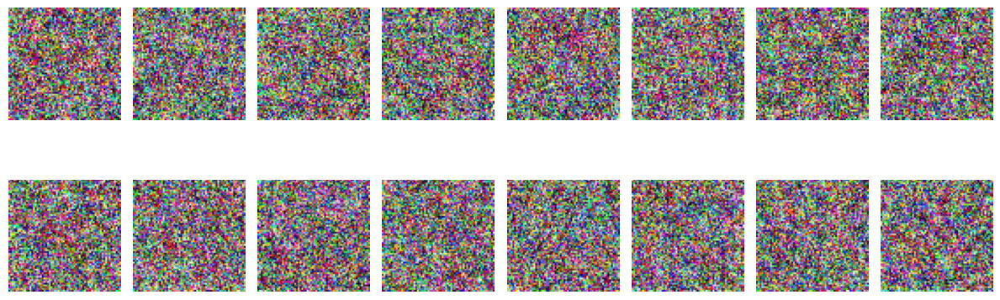

15/15 ━━━━━━━━━━━━━━━━━━━━ 108s 8s/step - loss: 0.0315 
Epoch 51/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0371
Epoch 52/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0354
Epoch 53/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0335
Epoch 54/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 327ms/step - loss: 0.0331
Epoch 55/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0329
Epoch 56/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0352
Epoch 57/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 324ms/step - loss: 0.0332
Epoch 58/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0351
Epoch 59/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0307
Epoch 60/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 326ms/step - loss: 0.0415
Epoch 61/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0350
Epoch 62/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0352
Epoch 63/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0342
Epoch 64/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 323m

100%|██████████| 1000/1000 [01:23<00:00, 12.04it/s]


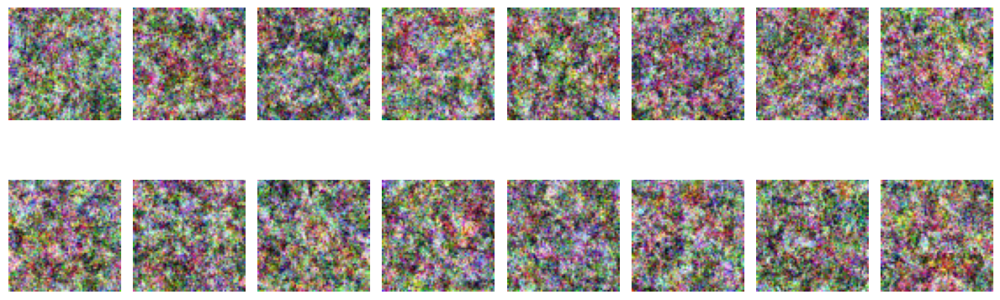

15/15 ━━━━━━━━━━━━━━━━━━━━ 89s 6s/step - loss: 0.0310  
Epoch 101/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0326
Epoch 102/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0303
Epoch 103/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0302
Epoch 104/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 327ms/step - loss: 0.0362
Epoch 105/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0357
Epoch 106/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0313
Epoch 107/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 326ms/step - loss: 0.0318
Epoch 108/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0304
Epoch 109/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0292
Epoch 110/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 327ms/step - loss: 0.0317
Epoch 111/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0309
Epoch 112/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0314
Epoch 113/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0313
Epoch 114/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:21<00:00, 12.23it/s]


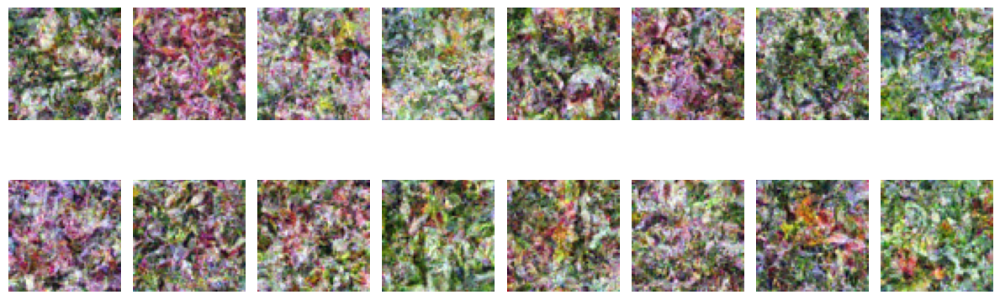

15/15 ━━━━━━━━━━━━━━━━━━━━ 88s 6s/step - loss: 0.0260  
Epoch 151/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0339
Epoch 152/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0355
Epoch 153/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0311
Epoch 154/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 327ms/step - loss: 0.0299
Epoch 155/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0292
Epoch 156/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0268
Epoch 157/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 328ms/step - loss: 0.0338
Epoch 158/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0356
Epoch 159/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0309
Epoch 160/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 324ms/step - loss: 0.0311
Epoch 161/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0344
Epoch 162/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0310
Epoch 163/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0293
Epoch 164/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:21<00:00, 12.27it/s]


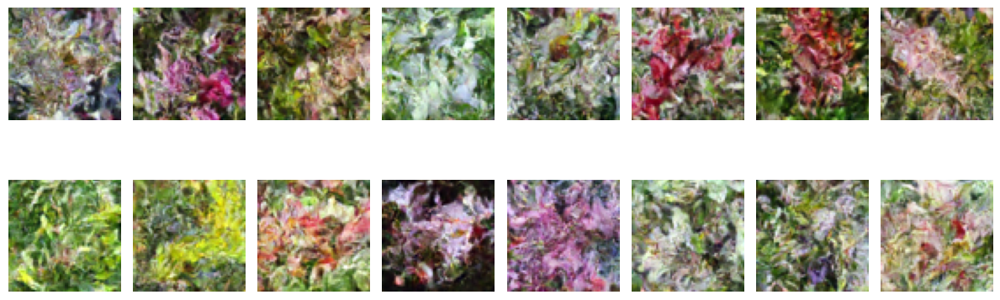

15/15 ━━━━━━━━━━━━━━━━━━━━ 87s 6s/step - loss: 0.0304  
Epoch 201/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0300
Epoch 202/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0302
Epoch 203/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0282
Epoch 204/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 327ms/step - loss: 0.0284
Epoch 205/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0322
Epoch 206/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0285
Epoch 207/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 328ms/step - loss: 0.0327
Epoch 208/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0306
Epoch 209/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0287
Epoch 210/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 324ms/step - loss: 0.0293
Epoch 211/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0287
Epoch 212/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0310
Epoch 213/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0272
Epoch 214/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:24<00:00, 11.85it/s]


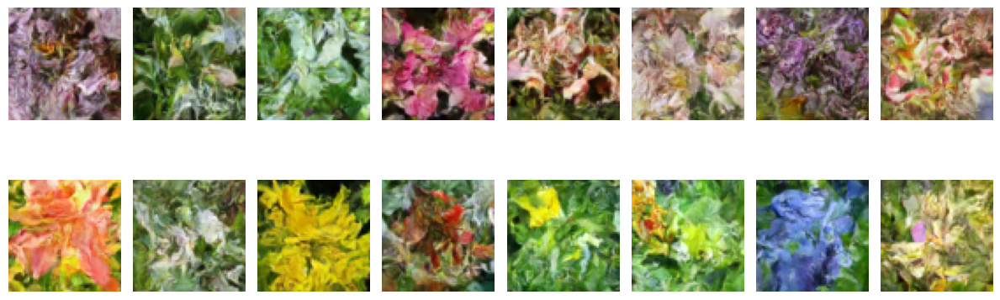

15/15 ━━━━━━━━━━━━━━━━━━━━ 90s 6s/step - loss: 0.0280  
Epoch 251/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0295
Epoch 252/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0283
Epoch 253/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0299
Epoch 254/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - loss: 0.0317
Epoch 255/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0279
Epoch 256/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0277
Epoch 257/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 328ms/step - loss: 0.0320
Epoch 258/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0299
Epoch 259/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0282
Epoch 260/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 327ms/step - loss: 0.0271
Epoch 261/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0298
Epoch 262/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0266
Epoch 263/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0300
Epoch 264/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:22<00:00, 12.07it/s]


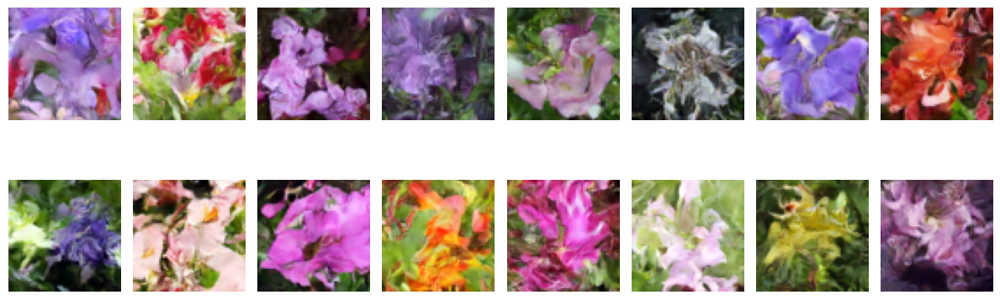

15/15 ━━━━━━━━━━━━━━━━━━━━ 89s 6s/step - loss: 0.0263  
Epoch 301/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0273
Epoch 302/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0273
Epoch 303/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0303
Epoch 304/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 329ms/step - loss: 0.0302
Epoch 305/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0308
Epoch 306/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0258
Epoch 307/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 328ms/step - loss: 0.0316
Epoch 308/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0261
Epoch 309/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0296
Epoch 310/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - loss: 0.0295
Epoch 311/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0277
Epoch 312/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0293
Epoch 313/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0257
Epoch 314/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:22<00:00, 12.07it/s]


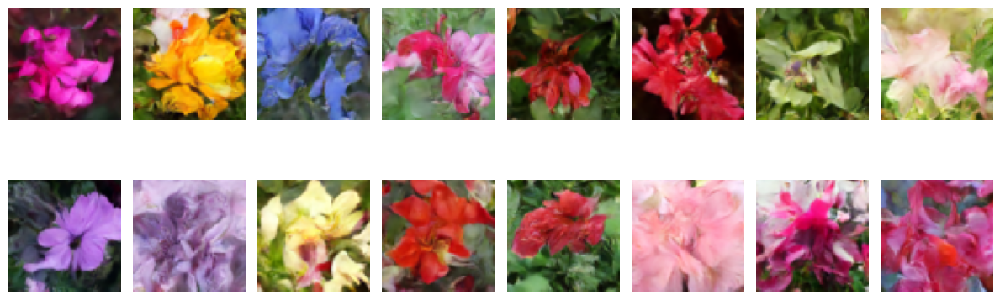

15/15 ━━━━━━━━━━━━━━━━━━━━ 89s 6s/step - loss: 0.0263  
Epoch 351/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0258
Epoch 352/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0310
Epoch 353/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0276
Epoch 354/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - loss: 0.0280
Epoch 355/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0285
Epoch 356/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0301
Epoch 357/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - loss: 0.0260
Epoch 358/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0242
Epoch 359/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0260
Epoch 360/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 326ms/step - loss: 0.0251
Epoch 361/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0284
Epoch 362/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0265
Epoch 363/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0301
Epoch 364/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:24<00:00, 11.81it/s]


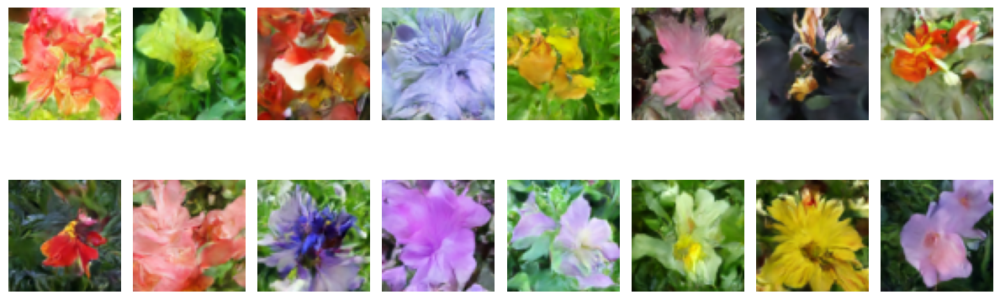

15/15 ━━━━━━━━━━━━━━━━━━━━ 90s 6s/step - loss: 0.0269  
Epoch 401/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0240
Epoch 402/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0300
Epoch 403/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0281
Epoch 404/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 344ms/step - loss: 0.0270
Epoch 405/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0314
Epoch 406/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0263
Epoch 407/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step - loss: 0.0304
Epoch 408/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0287
Epoch 409/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0272
Epoch 410/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 327ms/step - loss: 0.0275
Epoch 411/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0290
Epoch 412/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0262
Epoch 413/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0294
Epoch 414/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:23<00:00, 11.92it/s]


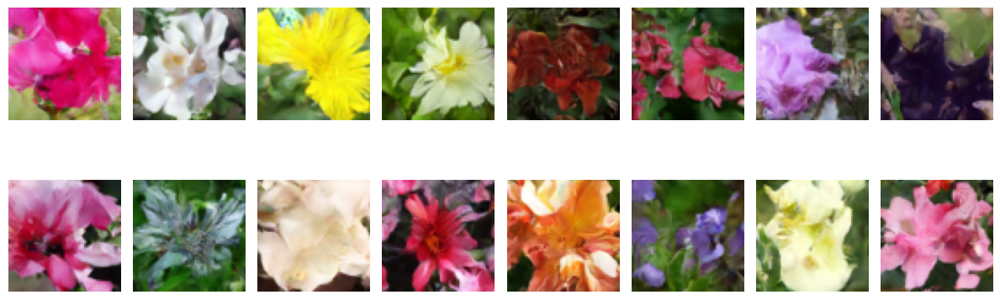

15/15 ━━━━━━━━━━━━━━━━━━━━ 90s 6s/step - loss: 0.0278  
Epoch 451/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0297
Epoch 452/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0279
Epoch 453/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0266
Epoch 454/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 331ms/step - loss: 0.0265
Epoch 455/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0291
Epoch 456/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0265
Epoch 457/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 332ms/step - loss: 0.0259
Epoch 458/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0231
Epoch 459/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0264
Epoch 460/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 328ms/step - loss: 0.0296
Epoch 461/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.0230
Epoch 462/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0281
Epoch 463/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0274
Epoch 464/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:23<00:00, 12.01it/s]


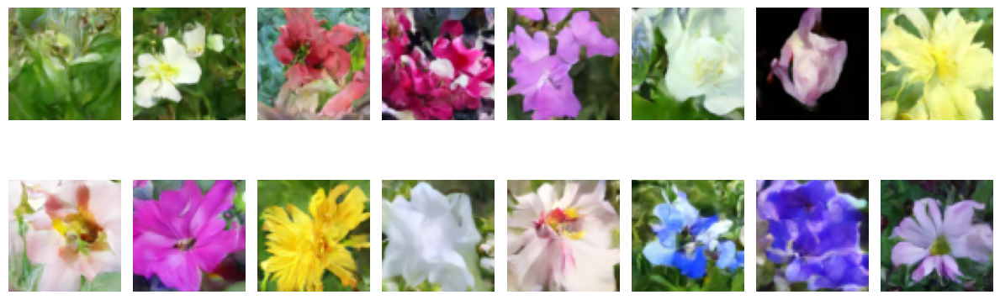

15/15 ━━━━━━━━━━━━━━━━━━━━ 89s 6s/step - loss: 0.0291  
Epoch 501/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0240
Epoch 502/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0268
Epoch 503/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0273
Epoch 504/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 331ms/step - loss: 0.0241
Epoch 505/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0253
Epoch 506/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0278
Epoch 507/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step - loss: 0.0268
Epoch 508/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0265
Epoch 509/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0289
Epoch 510/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 323ms/step - loss: 0.0281
Epoch 511/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0260
Epoch 512/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0287
Epoch 513/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0300
Epoch 514/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:24<00:00, 11.86it/s]


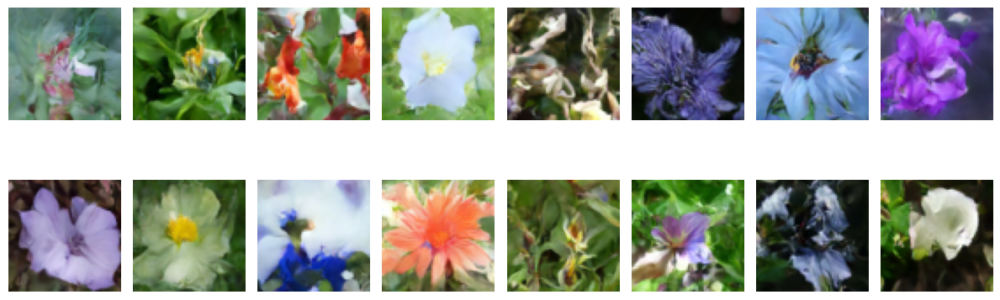

15/15 ━━━━━━━━━━━━━━━━━━━━ 90s 6s/step - loss: 0.0297  
Epoch 551/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0268
Epoch 552/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0262
Epoch 553/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0285
Epoch 554/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 333ms/step - loss: 0.0262
Epoch 555/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0250
Epoch 556/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0276
Epoch 557/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 332ms/step - loss: 0.0271
Epoch 558/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0266
Epoch 559/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0279
Epoch 560/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 323ms/step - loss: 0.0264
Epoch 561/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0293
Epoch 562/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0274
Epoch 563/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0290
Epoch 564/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:25<00:00, 11.65it/s]


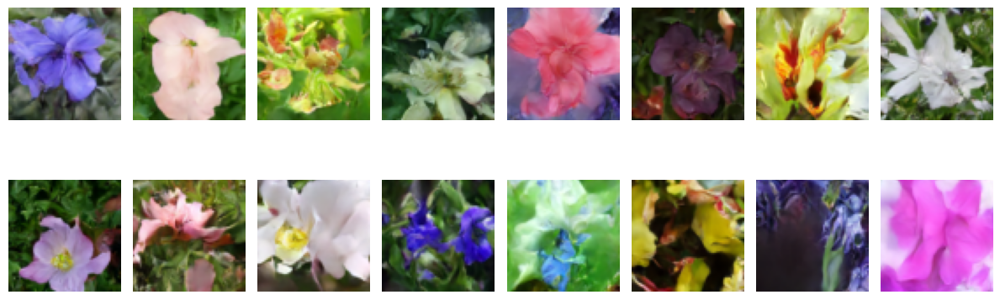

15/15 ━━━━━━━━━━━━━━━━━━━━ 92s 7s/step - loss: 0.0278  
Epoch 601/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0264
Epoch 602/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0299
Epoch 603/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0280
Epoch 604/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - loss: 0.0233
Epoch 605/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0268
Epoch 606/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0255
Epoch 607/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 333ms/step - loss: 0.0268
Epoch 608/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0248
Epoch 609/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0261
Epoch 610/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step - loss: 0.0274
Epoch 611/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0301
Epoch 612/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0288
Epoch 613/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0275
Epoch 614/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:23<00:00, 11.94it/s]


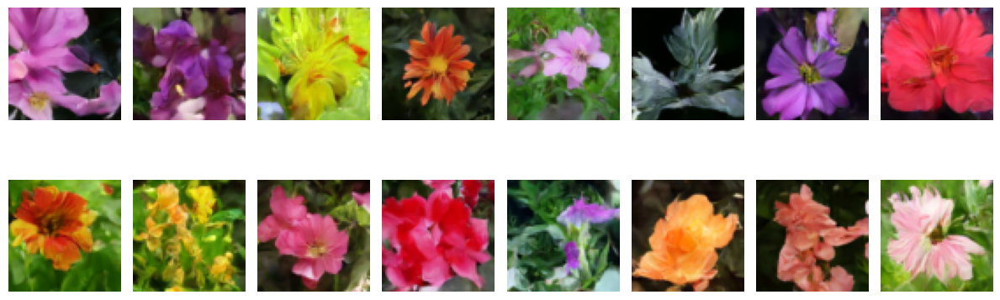

15/15 ━━━━━━━━━━━━━━━━━━━━ 89s 6s/step - loss: 0.0289  
Epoch 651/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0271
Epoch 652/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0265
Epoch 653/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0250
Epoch 654/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 329ms/step - loss: 0.0237
Epoch 655/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0249
Epoch 656/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0269
Epoch 657/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 333ms/step - loss: 0.0298
Epoch 658/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0289
Epoch 659/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0224
Epoch 660/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 326ms/step - loss: 0.0273
Epoch 661/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0228
Epoch 662/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0252
Epoch 663/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0247
Epoch 664/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:23<00:00, 11.98it/s]


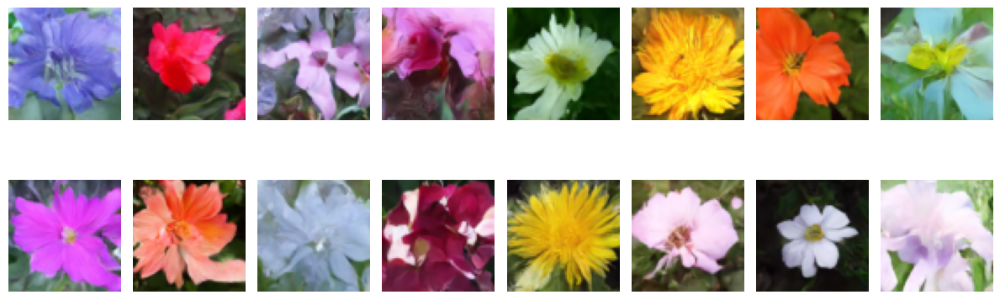

15/15 ━━━━━━━━━━━━━━━━━━━━ 90s 6s/step - loss: 0.0265  
Epoch 701/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0258
Epoch 702/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0264
Epoch 703/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0282
Epoch 704/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 331ms/step - loss: 0.0263
Epoch 705/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0263
Epoch 706/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0270
Epoch 707/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step - loss: 0.0268
Epoch 708/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0281
Epoch 709/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0271
Epoch 710/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 328ms/step - loss: 0.0238
Epoch 711/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0232
Epoch 712/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0288
Epoch 713/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0275
Epoch 714/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:27<00:00, 11.48it/s]


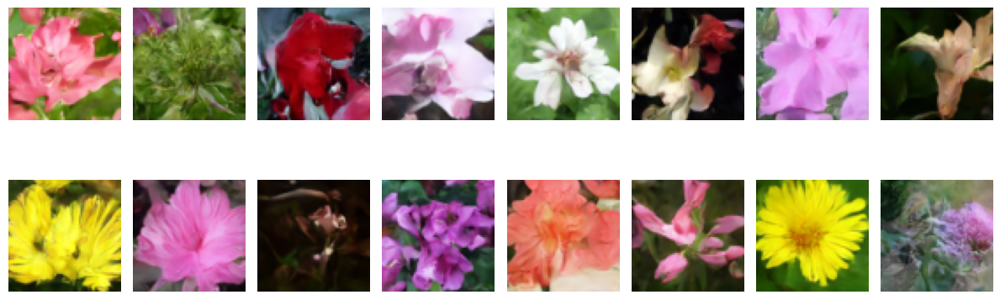

15/15 ━━━━━━━━━━━━━━━━━━━━ 93s 7s/step - loss: 0.0292  
Epoch 751/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0247
Epoch 752/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0254
Epoch 753/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0264
Epoch 754/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 331ms/step - loss: 0.0242
Epoch 755/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.0258
Epoch 756/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0273
Epoch 757/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 332ms/step - loss: 0.0216
Epoch 758/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0219
Epoch 759/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0276
Epoch 760/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 329ms/step - loss: 0.0256
Epoch 761/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0292
Epoch 762/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0239
Epoch 763/800
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.0268
Epoch 764/800
15/15 ━━━━━━━━━━━━━━

100%|██████████| 1000/1000 [01:24<00:00, 11.86it/s]


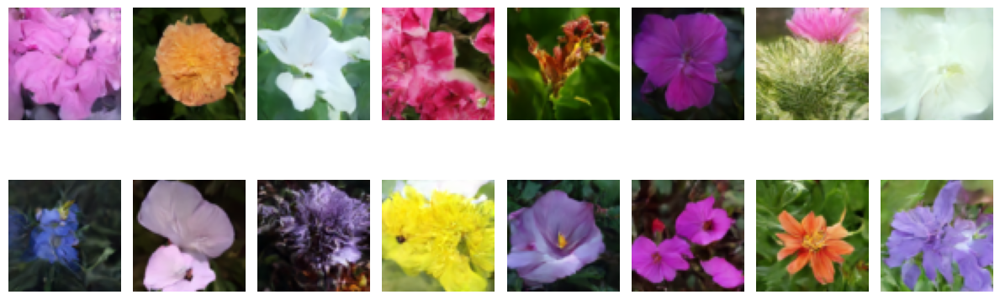

15/15 ━━━━━━━━━━━━━━━━━━━━ 90s 6s/step - loss: 0.0276  


In [20]:
# plotting images
class NEpochLogger(tf.keras.callbacks.Callback):
    def __init__(self, n):
        super().__init__()
        self._epoch = n # used in modulo below: print & plot every n

    def on_epoch_end(self, epoch, logs=None):
        if epoch > 0 and (epoch + 1) % self._epoch == 0:
            print()
            print(f"Epoch end: {epoch + 1}, plotting...")
            # callbacks have access to their model through self.model
            self.model.plot_images()

plot_every = 50
plot_callback = NEpochLogger(plot_every)

MODELS_DIR = pathlib.Path("models")
MODELS_DIR.mkdir(exist_ok=True)
ckpt_callback = tf.keras.callbacks.ModelCheckpoint(
    str(MODELS_DIR / "ddpm.weights.h5"),
    monitor="loss",
    save_weights_only=True,
    save_freq=50 # save model every 50 epochs
)

# Train the model
model.fit(
    train_ds,
    epochs=num_epochs,
    batch_size=batch_size,
    callbacks=[plot_callback, ckpt_callback],
)

Generating images:


100%|██████████| 1000/1000 [01:21<00:00, 12.27it/s]


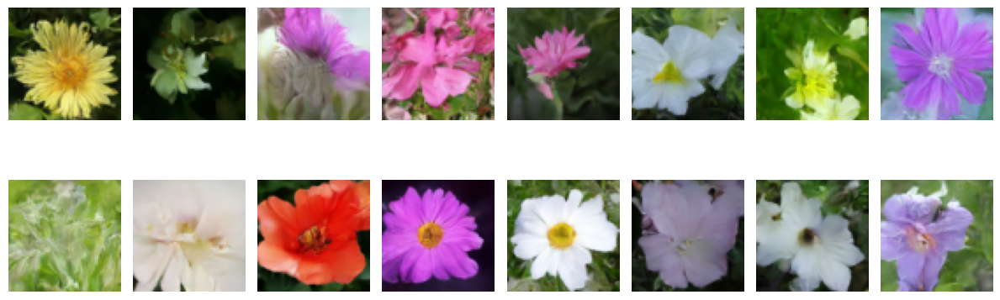

In [21]:
model.plot_images()

### Save to Google Drive

In [23]:
EXPORT=False

if EXPORT:
    # unwanted jupyter cache
    !rm -rf {MODELS_DIR}/.ipynb_checkpoints
    # zip models
    !zip ddpm.models.zip {MODELS_DIR}/*
    # connect to drive
    from google.colab import drive
    drive.mount('/content/drive')
    # copy zip to drive (adjust folder as needed)
    !cp ddpm.models.zip drive/MyDrive/IS53024B-Artificial-Intelligence/models

updating: models/ddpm.weights.h5 (deflated 9%)
Mounted at /content/drive


## Use your trained model


You can download the model I trained [here](https://drive.google.com/file/d/16PiTqJ6AL6TX19LydclHaRE9WhWwg4Ul/view?usp=sharing), for instance using `gdown` (no install needed on Colab):

```bash
!gdown [file id in url]
!unzip ddpm.models.zip
```

This will unzip the model to `models`, which works with the present code.

Generating images:


100%|██████████| 1000/1000 [01:32<00:00, 10.85it/s]


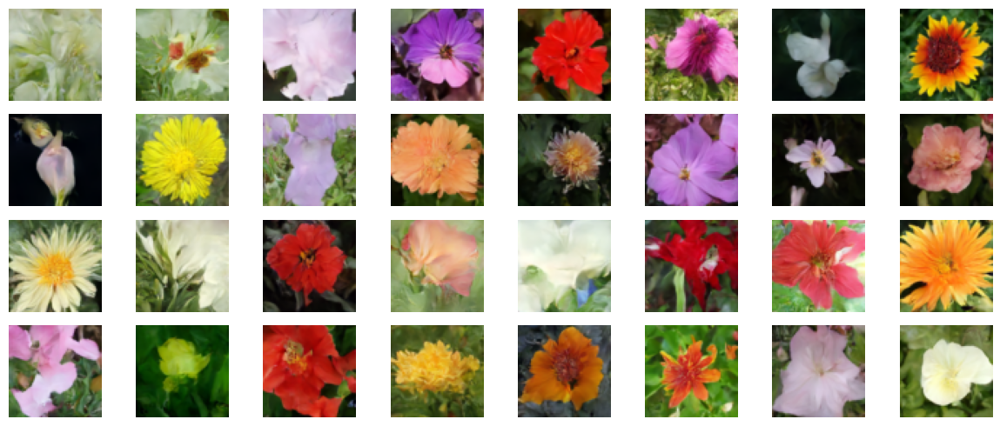

In [27]:
# Load the model weights
model.load_weights(MODELS_DIR / "ddpm.weights.h5")

# Generate and plot some samples
model.plot_images(num_rows=4, num_cols=8)

## Summary


- noising: **forward** process, denoising: **reverse** process
- **sampling** schedule: many varieties, many intricacies!
- **time embeddings** (sinusoidal)
- the **U-Net** predicts the noise
- using an additional net storing an **exponential moving average (EMA)** of the weights during training



### Experiments


- It should be possible to get good results with other image datasets, probably beating the DCGAN on CelebA (also possible to test on sound/music: turn samples into spectrograms and train on them as if they were images)!
- Class conditioning: modify the net to accept the class of the sample, so that it is possible to generate a sample from this class during inference (here's a [tutorial](https://huggingface.co/learn/diffusion-course/en/unit2/3)).

Suggestions from the original tutorial:

- Increasing the width of each block. A bigger model can learn to denoise
in fewer epochs, though you may have to take care of overfitting.
- Here the linear schedule for variance scheduling was implemented. You can implement other schemes like cosine scheduling and compare the performance. One possible path would be to compare this implementation with the [DDIM tutorial](https://keras.io/examples/generative/ddim/).